In [1]:
import pandas as pd
import numpy as np

tdata = pd.read_csv("tdata2.csv")

In [2]:
tdata.head()

,Trip ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,Fare,...,Additional Charges,Trip Total,Shared Trip Authorized,Trips Pooled,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
0,0003bbcd934e38da460749062b7b58ba02529e81,11/01/2020 12:00:00 AM,11/01/2020 12:15:00 AM,779.0,4.4,NaN,NaN,35.0,41.0,10.0,...,1.23,12.23,False,1,41.835118,-87.618678,POINT (-87.6186777673 41.8351179863),41.794090,-87.592311,POINT (-87.592310855 41.794090253)
1,000ad28aed5cdb660a1332ef0061d8782e23409c,11/01/2020 12:00:00 AM,11/01/2020 12:00:00 AM,448.0,1.4,1.703128e+10,1.703183e+10,28.0,28.0,7.5,...,1.23,8.73,False,1,41.885300,-87.642808,POINT (-87.6428084655 41.8853000224),41.871689,-87.654093,POINT (-87.6540926517 41.8716894745)
2,001b36e51fec896fb5aef60741b1bcf27c8b4fb2,11/01/2020 12:00:00 AM,11/01/2020 12:15:00 AM,573.0,5.4,1.703132e+10,1.703106e+10,32.0,6.0,12.5,...,3.10,18.60,False,1,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),41.938391,-87.638575,POINT (-87.6385749205 41.9383912577)
3,002c55b7ae1589b08ce275a1346a06378099a81f,11/01/2020 12:00:00 AM,11/01/2020 12:15:00 AM,1047.0,4.4,1.703184e+10,1.703106e+10,24.0,6.0,10.0,...,3.10,13.10,False,1,41.898306,-87.653614,POINT (-87.6536139825 41.8983058696),41.945282,-87.661545,POINT (-87.6615450961 41.9452823311)
4,003093710bb47cd0a3de34d98b97dfd3d22f9e3f,11/01/2020 12:00:00 AM,11/01/2020 12:15:00 AM,820.0,4.7,NaN,NaN,71.0,66.0,7.5,...,3.10,10.60,False,1,41.744205,-87.656306,POINT (-87.6563059862 41.7442051463),41.771849,-87.695666,POINT (-87.695666342 41.7718485152)


In [3]:
pdata = tdata["Pickup Census Tract"]

In [4]:
pdata = pdata.dropna()

In [5]:
pickup_data = pdata.value_counts().reset_index()

In [6]:
pickup_data.astype(int)

,index,Pickup Census Tract
0,17031980000,9661
1,17031839100,9490
2,17031320100,6997
3,17031081800,6054
4,17031833000,5392
...,...,...
922,17031770902,1
923,17031660301,1
924,17031823903,1
925,17031815000,1


In [7]:
pickup_data.columns = ["GEOID","Pickup"]

In [8]:
pickup_data

,GEOID,Pickup
0,1.703198e+10,9661
1,1.703184e+10,9490
2,1.703132e+10,6997
3,1.703108e+10,6054
4,1.703183e+10,5392
...,...,...
922,1.703177e+10,1
923,1.703166e+10,1
924,1.703182e+10,1
925,1.703182e+10,1


In [9]:
pickup_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 927 entries, 0 to 926
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GEOID   927 non-null    float64
 1   Pickup  927 non-null    int64  
dtypes: float64(1), int64(1)
memory usage: 14.6 KB


In [10]:
import folium
import geopandas as gpd

geodata = gpd.read_file("shapes.geojson")

In [11]:
geodata = geodata[geodata["GEOID"].notna()]
geodata = geodata.astype({"GEOID":"int"}) 

In [12]:
geodata = geodata[geodata["GEOID"].isin(pickup_data["GEOID"])]
geodata = geodata.to_crs(epsg = 4326)

In [13]:
geodata.head()

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,17,031,843800,1400000US17031843800,17031843800,8438,CT,1309516,0,"POLYGON ((-87.64554 41.80886, -87.64068 41.808..."
2,17,031,243000,1400000US17031243000,17031243000,2430,CT,324548,0,"POLYGON ((-87.68195 41.89583, -87.67950 41.895..."
3,17,031,250600,1400000US17031250600,17031250600,2506,CT,647765,0,"POLYGON ((-87.77560 41.90925, -87.77536 41.909..."
4,17,031,251700,1400000US17031251700,17031251700,2517,CT,486655,0,"POLYGON ((-87.74826 41.89498, -87.74645 41.895..."
5,17,031,260400,1400000US17031260400,17031260400,2604,CT,328225,0,"POLYGON ((-87.74061 41.88781, -87.73571 41.887..."


In [14]:
Chicago_Map = folium.Map(location = [41.8,-87.6])
Chicago_Map

In [15]:
folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data=pickup_data,
    columns=["GEOID","Pickup"],
    threshold_scale = [0,500,1000,1500,2000,2500,8000,10000],
    key_on="feature.properties.GEOID",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Pickups by Census Tract",
).add_to(Chicago_Map)

folium.LayerControl().add_to(Chicago_Map)


Chicago_Map

In [16]:
median_income = pd.read_csv("MedianIncome.csv")

In [17]:
median_income.head()

,Unnamed: 0,GEOID,MedianIncome
0,1,17031010100,63138
1,2,17031010201,41125
2,3,17031010202,45236
3,4,17031010300,72917
4,5,17031010400,58438


In [18]:
median_income = median_income.drop([0])

In [19]:
median_income.dropna()

,Unnamed: 0,GEOID,MedianIncome
1,2,17031010201,41125
2,3,17031010202,45236
3,4,17031010300,72917
4,5,17031010400,58438
5,6,17031010501,52747
...,...,...,...
1313,1315,17031843800,41250
1314,1316,17031843900,50104
1315,1317,17031980000,0
1316,1318,17031980100,0


In [20]:
median_income.columns[2]

'MedianIncome'

In [21]:
median_income

,Unnamed: 0,GEOID,MedianIncome
1,2,17031010201,41125
2,3,17031010202,45236
3,4,17031010300,72917
4,5,17031010400,58438
5,6,17031010501,52747
...,...,...,...
1313,1315,17031843800,41250
1314,1316,17031843900,50104
1315,1317,17031980000,0
1316,1318,17031980100,0


In [22]:
median_income.head()

,Unnamed: 0,GEOID,MedianIncome
1,2,17031010201,41125
2,3,17031010202,45236
3,4,17031010300,72917
4,5,17031010400,58438
5,6,17031010501,52747


In [23]:
median_income.tail()

,Unnamed: 0,GEOID,MedianIncome
1313,1315,17031843800,41250
1314,1316,17031843900,50104
1315,1317,17031980000,0
1316,1318,17031980100,0
1317,1319,17031990000,0


In [24]:
median_income = median_income[["GEOID","MedianIncome"]]

In [25]:
median_income.dropna()

,GEOID,MedianIncome
1,17031010201,41125
2,17031010202,45236
3,17031010300,72917
4,17031010400,58438
5,17031010501,52747
...,...,...
1313,17031843800,41250
1314,17031843900,50104
1315,17031980000,0
1316,17031980100,0


In [26]:
median_income = median_income[median_income["GEOID"] != ""]

In [27]:
median_income = median_income[median_income["MedianIncome"] != "-"]

In [28]:
median_income

,GEOID,MedianIncome
1,17031010201,41125
2,17031010202,45236
3,17031010300,72917
4,17031010400,58438
5,17031010501,52747
...,...,...
1313,17031843800,41250
1314,17031843900,50104
1315,17031980000,0
1316,17031980100,0


In [29]:
median_income = median_income.astype({"GEOID":"int"})
median_income

,GEOID,MedianIncome
1,17031010201,41125
2,17031010202,45236
3,17031010300,72917
4,17031010400,58438
5,17031010501,52747
...,...,...
1313,17031843800,41250
1314,17031843900,50104
1315,17031980000,0
1316,17031980100,0


In [30]:
median_income.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1317 entries, 1 to 1317
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   GEOID         1317 non-null   int64
 1   MedianIncome  1317 non-null   int64
dtypes: int64(2)
memory usage: 30.9 KB


In [31]:
median_income[median_income["GEOID"].isin(pickup_data["GEOID"])]

,GEOID,MedianIncome
1,17031010201,41125
2,17031010202,45236
3,17031010300,72917
4,17031010400,58438
5,17031010501,52747
...,...,...
1312,17031843700,194375
1313,17031843800,41250
1314,17031843900,50104
1315,17031980000,0


In [32]:
median_income.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1317 entries, 1 to 1317
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   GEOID         1317 non-null   int64
 1   MedianIncome  1317 non-null   int64
dtypes: int64(2)
memory usage: 30.9 KB


In [33]:
Income_Map = folium.Map(location = [41.8,-87.6])
Income_Map

In [34]:
folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data=median_income,
    columns=["GEOID","MedianIncome"],
#     threshold_scale = [0,1000,5000,10000,20000,50000,80000,100000],
    key_on="feature.properties.GEOID",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Median Income",
).add_to(Income_Map)

folium.LayerControl().add_to(Income_Map)


Income_Map

In [35]:
combined_df = pd.merge(median_income,pickup_data)

In [36]:
combined_df.head()

,GEOID,MedianIncome,Pickup
0,17031010201,41125,305
1,17031010202,45236,233
2,17031010300,72917,280
3,17031010400,58438,240
4,17031010501,52747,234


In [37]:
from simpledbf import Dbf5

dbf = Dbf5("Data_Austin.dbf")

In [38]:
more_data = dbf.to_dataframe()

In [39]:
combined_df.describe()

,GEOID,MedianIncome,Pickup
count,9.250000e+02,925.000000,925.000000
mean,1.703147e+10,83097.527568,258.009730
std,2.981447e+05,54067.674400,778.952241
min,1.703101e+10,0.000000,1.000000
25%,1.703120e+10,44875.000000,12.000000
50%,1.703146e+10,66731.000000,47.000000
75%,1.703181e+10,106375.000000,167.000000
max,1.703198e+10,250000.000000,9661.000000


In [40]:
d4a = more_data[["GEOID10", "D4A"]]

In [41]:
d4a.columns = ["GEOID", "D4A"]
d4a

,GEOID,D4A
0,170318134001,276.27
1,170318205022,441.23
2,170316720003,156.91
3,170315608003,319.19
4,171118706042,1105.08
...,...,...
6903,550590030012,-99999.00
6904,550590008003,-99999.00
6905,550590027001,-99999.00
6906,550590021002,-99999.00


In [42]:
d4a["GEOID"] = d4a["GEOID"].str[:-1]

/var/folders/zc/cc95gj757jqdfmtj7lsf19j00000gn/T/ipykernel_2154/645360293.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d4a["GEOID"] = d4a["GEOID"].str[:-1]


In [43]:
d4a

,GEOID,D4A
0,17031813400,276.27
1,17031820502,441.23
2,17031672000,156.91
3,17031560800,319.19
4,17111870604,1105.08
...,...,...
6903,55059003001,-99999.00
6904,55059000800,-99999.00
6905,55059002700,-99999.00
6906,55059002100,-99999.00


In [44]:
d4a = d4a[d4a["D4A"] >= 0]

In [45]:
d4a["GEOID"] = d4a["GEOID"].astype("int")

/var/folders/zc/cc95gj757jqdfmtj7lsf19j00000gn/T/ipykernel_2154/465543962.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d4a["GEOID"] = d4a["GEOID"].astype("int")


In [46]:
d4a.describe()

,GEOID,D4A
count,4.429000e+03,4429.000000
mean,1.711759e+10,393.119178
std,1.616197e+09,261.452939
min,1.703101e+10,0.000000
25%,1.703138e+10,214.580000
50%,1.703181e+10,309.800000
75%,1.703183e+10,510.970000
max,5.505900e+10,1207.000000


In [47]:
d4a = d4a[d4a["GEOID"].isin(pickup_data["GEOID"])]

In [48]:
combined_df = pd.merge(combined_df,d4a)

In [49]:
combined_df

,GEOID,MedianIncome,Pickup,D4A
0,17031010201,41125,305,332.60
1,17031010201,41125,305,223.97
2,17031010201,41125,305,146.18
3,17031010202,45236,233,308.46
4,17031010202,45236,233,79.13
...,...,...,...,...
2678,17031843900,50104,261,207.87
2679,17031843900,50104,261,154.23
2680,17031843900,50104,261,73.76
2681,17031843900,50104,261,296.39


In [50]:
D4A_Map = folium.Map(location = [41.8,-87.6])
D4A_Map

In [51]:
folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data= combined_df,
    columns=["GEOID","D4A"],
#     threshold_scale = [0,1000,5000,10000,20000,50000,80000,100000],
    key_on="feature.properties.GEOID",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="D4A",
).add_to(D4A_Map)

folium.LayerControl().add_to(D4A_Map)


D4A_Map

<function matplotlib.pyplot.show(close=None, block=None)>

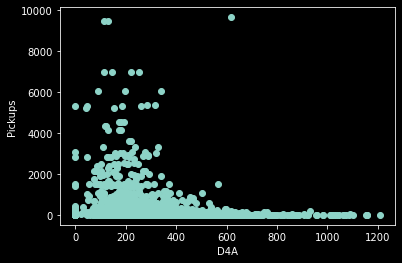

In [52]:
import matplotlib.pyplot as plt


plt.scatter(combined_df["D4A"],combined_df["Pickup"],)
plt.xlabel("D4A")
plt.ylabel("Pickups")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

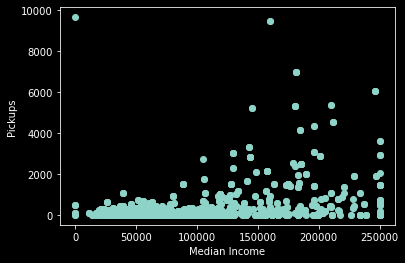

In [53]:
plt.scatter(combined_df["MedianIncome"],combined_df["Pickup"])
plt.xlabel("Median Income")
plt.ylabel("Pickups")
plt.show

In [54]:
car_ownership = more_data[["GEOID10","Pct_AO0"]]

In [55]:
car_ownership.head()

,GEOID10,Pct_AO0
0,170318134001,0.150470
1,170318205022,0.153664
2,170316720003,0.374005
3,170315608003,0.000000
4,171118706042,0.141518


In [56]:
car_ownership = car_ownership.rename(columns={"GEOID10":"GEOID","Pct_AO0":"Car Ownership"})

In [57]:
car_ownership

,GEOID,Car Ownership
0,170318134001,0.150470
1,170318205022,0.153664
2,170316720003,0.374005
3,170315608003,0.000000
4,171118706042,0.141518
...,...,...
6903,550590030012,0.012365
6904,550590008003,0.190083
6905,550590027001,0.018066
6906,550590021002,0.000000


In [58]:
car_ownership["GEOID"] = car_ownership["GEOID"].str[:-1]

In [59]:
car_ownership

,GEOID,Car Ownership
0,17031813400,0.150470
1,17031820502,0.153664
2,17031672000,0.374005
3,17031560800,0.000000
4,17111870604,0.141518
...,...,...
6903,55059003001,0.012365
6904,55059000800,0.190083
6905,55059002700,0.018066
6906,55059002100,0.000000


In [60]:
car_ownership["Car Ownership"] = car_ownership["Car Ownership"]*100

In [61]:
car_ownership

,GEOID,Car Ownership
0,17031813400,15.047022
1,17031820502,15.366430
2,17031672000,37.400531
3,17031560800,0.000000
4,17111870604,14.151828
...,...,...
6903,55059003001,1.236476
6904,55059000800,19.008264
6905,55059002700,1.806589
6906,55059002100,0.000000


In [62]:
car_ownership["GEOID"] = car_ownership["GEOID"].astype("int")

In [63]:
car_ownership.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6908 entries, 0 to 6907
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   GEOID          6908 non-null   int64  
 1   Car Ownership  6908 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 108.1 KB


In [64]:
car_ownership = car_ownership[car_ownership["GEOID"].isin(pickup_data["GEOID"])]

In [65]:
combined_df = pd.merge(combined_df,car_ownership)

In [66]:
combined_df

,GEOID,MedianIncome,Pickup,D4A,Car Ownership
0,17031010201,41125,305,332.60,37.739590
1,17031010201,41125,305,332.60,15.828402
2,17031010201,41125,305,332.60,14.629259
3,17031010201,41125,305,223.97,37.739590
4,17031010201,41125,305,223.97,15.828402
...,...,...,...,...,...
9580,17031843900,50104,261,296.39,53.367876
9581,17031843900,50104,261,296.39,32.485876
9582,17031843900,50104,261,296.39,19.916143
9583,17031843900,50104,261,296.39,6.315789


In [67]:
Car_Map = folium.Map(location = [41.8,-87.6])

folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data= combined_df,
    columns=["GEOID","Car Ownership"],
#     threshold_scale = [0,1000,5000,10000,20000,50000,80000,100000],
    key_on="feature.properties.GEOID",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Percentage of people with 0 cars",
).add_to(Car_Map)

folium.LayerControl().add_to(Car_Map)


Car_Map

<function matplotlib.pyplot.show(close=None, block=None)>

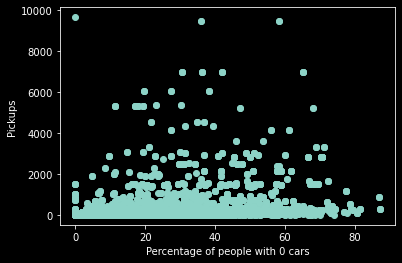

In [68]:
plt.scatter(combined_df["Car Ownership"],combined_df["Pickup"])
plt.xlabel("Percentage of people with 0 cars")
plt.ylabel("Pickups")
plt.show

In [69]:
combined_df.head(30)

,GEOID,MedianIncome,Pickup,D4A,Car Ownership
0,17031010201,41125,305,332.60,37.739590
1,17031010201,41125,305,332.60,15.828402
2,17031010201,41125,305,332.60,14.629259
3,17031010201,41125,305,223.97,37.739590
4,17031010201,41125,305,223.97,15.828402
5,17031010201,41125,305,223.97,14.629259
6,17031010201,41125,305,146.18,37.739590
7,17031010201,41125,305,146.18,15.828402
8,17031010201,41125,305,146.18,14.629259
9,17031010202,45236,233,308.46,28.040541


In [70]:
d1b = more_data[["GEOID10","D1B"]]

In [71]:
d1b = d1b.rename(columns={"GEOID10":"GEOID","D1B": "Population Density"})

In [72]:
d1b["GEOID"] = d1b["GEOID"].str[:-1]

In [73]:
d1b["GEOID"] = d1b["GEOID"].astype("int")

In [74]:
combined_df = pd.merge(d1b,combined_df)

In [75]:
combined_df

,GEOID,Population Density,MedianIncome,Pickup,D4A,Car Ownership
0,17031813400,11.256809,49453,19,276.27,15.047022
1,17031813400,11.256809,49453,19,276.27,11.970075
2,17031813400,11.256809,49453,19,276.27,0.000000
3,17031813400,11.256809,49453,19,276.27,5.917160
4,17031813400,11.256809,49453,19,276.27,8.123249
...,...,...,...,...,...,...
39352,17031310200,19.974207,74236,86,142.16,30.864198
39353,17031310200,23.278650,74236,86,360.76,12.615385
39354,17031310200,23.278650,74236,86,360.76,30.864198
39355,17031310200,23.278650,74236,86,142.16,12.615385


In [76]:
Population_Map = folium.Map(location = [41.8,-87.6])

folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data= combined_df,
    columns=["GEOID","Population Density"],
    threshold_scale = [0,10,20,30,40,50,100,200,300,500],
    key_on="feature.properties.GEOID",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Population Density",
).add_to(Population_Map)

folium.LayerControl().add_to(Population_Map)


Population_Map

<function matplotlib.pyplot.show(close=None, block=None)>

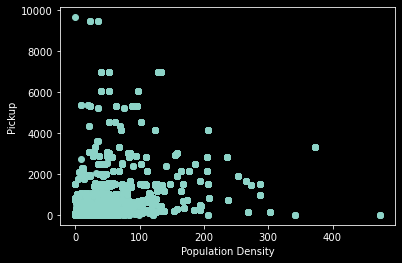

In [77]:
plt.scatter(combined_df["Population Density"],combined_df["Pickup"])
plt.xlabel("Population Density")
plt.ylabel("Pickup")
plt.show

In [78]:
combined_df.shape

(39357, 6)

In [79]:
d1c = more_data[["GEOID10","D1C"]]

In [80]:
d1c

,GEOID10,D1C
0,170318134001,1.897215
1,170318205022,1.411821
2,170316720003,0.109539
3,170315608003,1.859338
4,171118706042,1.188688
...,...,...
6903,550590030012,0.033831
6904,550590008003,0.749299
6905,550590027001,0.229435
6906,550590021002,0.043571


In [81]:
d1c["GEOID10"] = d1c["GEOID10"].str[:-1]
d1c = d1c.rename(columns={"GEOID10":"GEOID","D1C":"Employment Density"})
d1c["GEOID"] = d1c["GEOID"].astype("int")


/var/folders/zc/cc95gj757jqdfmtj7lsf19j00000gn/T/ipykernel_2154/1591162141.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1c["GEOID10"] = d1c["GEOID10"].str[:-1]


In [82]:
d1c


,GEOID,Employment Density
0,17031813400,1.897215
1,17031820502,1.411821
2,17031672000,0.109539
3,17031560800,1.859338
4,17111870604,1.188688
...,...,...
6903,55059003001,0.033831
6904,55059000800,0.749299
6905,55059002700,0.229435
6906,55059002100,0.043571


In [83]:
combined_df = pd.merge(d1c,combined_df)

In [84]:
combined_df

,GEOID,Employment Density,Population Density,MedianIncome,Pickup,D4A,Car Ownership
0,17031813400,1.897215,11.256809,49453,19,276.27,15.047022
1,17031813400,1.897215,11.256809,49453,19,276.27,11.970075
2,17031813400,1.897215,11.256809,49453,19,276.27,0.000000
3,17031813400,1.897215,11.256809,49453,19,276.27,5.917160
4,17031813400,1.897215,11.256809,49453,19,276.27,8.123249
...,...,...,...,...,...,...,...
178846,17031310200,5.262718,19.974207,74236,86,142.16,30.864198
178847,17031310200,5.262718,23.278650,74236,86,360.76,12.615385
178848,17031310200,5.262718,23.278650,74236,86,360.76,30.864198
178849,17031310200,5.262718,23.278650,74236,86,142.16,12.615385


In [85]:
d1c["Employment Density"].min()

0.0

In [86]:
Employment_Map = folium.Map(location = [41.8,-87.6])

folium.Choropleth(
    geo_data=geodata,
    name="choropleth",
    data= combined_df,
    columns=["GEOID","Employment Density"],
    threshold_scale = [0,10,20,30,40,50,100,200,300,500,1000,2000],
    key_on="feature.properties.GEOID",
    fill_color="",
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Employment Density",
).add_to(Employment_Map)

folium.LayerControl().add_to(Employment_Map)

Employment_Map

KeyError: 'Blues'

<function matplotlib.pyplot.show(close=None, block=None)>

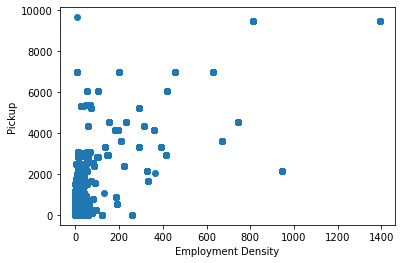

In [ ]:
plt.scatter(combined_df["Employment Density"],combined_df["Pickup"])
plt.xlabel("Employment Density")
plt.ylabel("Pickup")
plt.show